In [1]:
%matplotlib inline
import cv2
import numpy as np
import os
from tqdm.notebook import tqdm

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib_inline import backend_inline
from IPython.display import HTML, clear_output


backend_inline.set_matplotlib_formats('svg')

## 混合高斯模型

对图像进行建模，对每个像素进行匹配, 建模为混合高斯分布。

(120, 160, 3)

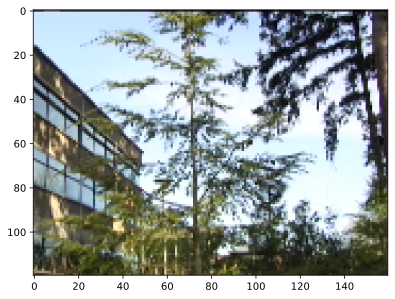

In [2]:
img_frame_0 = cv2.imread(f"./DataSet/WavingTrees/b00000.bmp")
img_frame_0 = cv2.cvtColor(img_frame_0, cv2.COLOR_BGR2RGB)
plt.imshow(img_frame_0)
img_frame_0.shape

## 建立模型

建立模型。设定为K个高斯的混合分布，

每个高斯分布为 3 维高斯分布 (对应图像的通道数)

通过权重来表示其属于某分布的概率。

In [3]:
def get_init_mu(k:int, img_shape:tuple):
    """初始化高斯分布的中值mu"""
    shape = [*img_shape]
    shape.insert(2, k)
    return np.zeros(shape)

def get_init_sigma(core:np.ndarray, k:int, img_shape:tuple):
    """ 初始化 (h, w, k, c, c) 形状的sigma矩阵, 输入为初始协方差矩阵 """
    # 把初始协方差复制 k 遍
    core = core[None, :]
    core = np.repeat(core, k, 0)
    # 再把 k 个初始协方差复制给每个像素
    core = core[None, :]
    core = np.repeat(core, img_shape[1], 0)
    core = core[None, :]
    core = np.repeat(core, img_shape[0], 0)
    return core

def get_init_weight(k:int, img_shape:tuple):
    """ 初始化 (h, w, k) 形状的权重矩阵,代表该像素属于某分布的概率 """
    # 生成随机迪利克雷分布, 其和为1。
    weight = np.random.dirichlet(np.ones(k),size=(1))
    # 复制到每个像素上
    weight = np.repeat(weight, img_shape[1], 0)
    weight = weight[None, :]
    weight = np.repeat(weight, img_shape[0], 0)
    return weight

### 初始化模型

利用上述函数初始化模型数组。

利用首张图像对均值进行初始化。这个过程将每个像素中每个分布的均值都设为首张图像的像素值。

In [4]:
shape  = img_frame_0.shape
k      = 5
lr     = 1e-2
# 使用对角阵建立协方差矩阵，此时的高斯分布是均匀，互不影响的。
cov   = 255. * np.eye(shape[2])

_mat    = get_init_sigma(cov, k, shape)
_weight = get_init_weight(k, shape)
_mu     = get_init_mu(k, shape)

print(f"协方差数组:{_mat.shape}, 均值数组:{_mu.shape}, 权重数组：{_weight.shape}")

协方差数组:(120, 160, 5, 3, 3), 均值数组:(120, 160, 5, 3), 权重数组：(120, 160, 5)


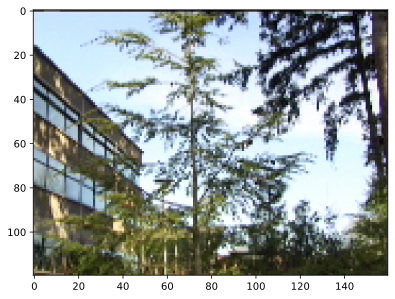

In [6]:
_mu[:,:,:,:] = np.repeat(img_frame_0[:,:,None,:], k, 2)
# 每个分布都是第一张图像
plt.imshow(_mu[:,:,k//2,:]/256)

## 检查某像素与高斯模型的匹配度

令 $d = \sqrt{(x-\mu)^T\Sigma^{-1}(x-\mu)}$


以下代码将各个点的像素值与各个高斯分布进行计算，得到 $\frac{|{x-\mu}|}{\sqrt{\Sigma}}$ 。

In [5]:
def data_processor(img:np.ndarray, mu:np.ndarray, sigma:np.ndarray):
    """返回均值误差, 被复制了K遍的图像, 高斯模型数量, 图像通道数
        
        输出参数
        ----------
        `error` : array[ h, w, k, c, 1 ]
        `img_k` : array[ h, w, k, c ]
        `k`     : int
        `c`     : int
    """
    if mu.shape[2] == sigma.shape[2]:
        k = mu.shape[2]
    else:
        raise Exception(f"检查参数的形状, 它们应该具有相同的高斯模型个数\
            \n\tmu: {mu.shape[2]}, Sigma: {sigma.shape[2]}")
    if mu.shape[-1] == sigma.shape[-1] == img.shape[-1]:
        c = mu.shape[-1]
    else:
        raise Exception(f"检查参数的形状, 图像的通道数应该一致\
            \n\timg: {img.shape[-1]}, mu: {mu.shape[-1]}, \
            Sigma: {sigma.shape[-1]}")
    # 把图像复制k遍 (分配给每个高斯分布)
    img = img[:,:,None,:]
    img = np.repeat(img, k, 2)
    # (计算每像素与高斯均值的误差)
    erro:np.ndarray = img - mu
    erro = erro[:,:,:,None,:]
    return erro, img, k, c


def get_distance(erro:np.ndarray, sigma:np.ndarray):
    """计算图像每像素在各高斯模型上的匹配度

        输出参数
        ----------
        `d` : array[ h, w, k, 1 ]
    """
    d = np.sqrt(erro @ np.linalg.inv(sigma) @ np.transpose(erro, (0,1,2,4,3)))
    return d.squeeze(-1)

In [6]:
img_frame_200 = cv2.imread(f"./DataSet/WavingTrees/b00200.bmp")
img_frame_200 = cv2.cvtColor(img_frame_200, cv2.COLOR_BGR2RGB)
_erro, _, _, _ = data_processor(img_frame_200, _mu, _mat)
d = get_distance(_erro, _mat)
# [h, w, k, d]
d.shape

(120, 160, 5, 1)

可设定阈值 $T=2.5$，判断该点是否匹配某个分布:

在高斯模型上满足 $ \frac{|{x-\mu}|}{\sqrt{\Sigma}} < 2.5 $ 

In [7]:
def get_mask(distance:np.ndarray, threshold:float=2.5):
    """
        返回像素对所有模型是否匹配的掩码, 匹配为True
        
        输出参数
        ----------
        `mask` : array[ h, w, k ], dtype='bool'
    """
    return (distance<threshold).squeeze(-1)

def get_unmatched(mask:np.ndarray)->np.ndarray:
    """
        找到没有匹配任何模型的像素掩码, 该像素未匹配任何模型为True
        
        输入参数
        ----------
        `mask` : array[ h, w, k ], dtype='bool'

        输出参数
        ----------
        `unmatched` : array[ h, w ], dtype='bool'
    """
    unmatched = np.sum(mask, -1)
    unmatched = unmatched == 0
    return unmatched

def get_min_mask(weight):
    """
    返回权重最小掩码, 权重最小的位置为True

    输入参数
    ----------
    `weight` : array[ h, w, k ]

    输出参数
    ----------
    `min_mask` : array[ h, w ], dtype='bool'
    """
    min_map  = np.argmin(weight, -1)
    # 分配内存
    min_mask = np.full(weight.shape, False, bool)
    # 将掩码在模型数量上堆叠
    for k in range(weight.shape[-1]):
        k_mask = min_map == k
        min_mask[:,:,k] = k_mask
    return min_mask


In [10]:
# 测试掩码生成函数
print(get_mask(d).shape)
print(get_mask(d)[25:35, 25:35, 0])

(120, 160, 5)
[[ True  True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True  True]
 [ True  True  True  True  True  True  True  True  True False]
 [ True  True  True  True  True  True  True False False False]
 [ True  True  True  True  True False False  True False  True]
 [ True  True False False False False  True False False False]
 [ True  True  True  True  True False False  True False False]
 [ True  True  True False  True  True  True  True False False]]


## EM过程迭代更新模型
在EM过程中更新每个像素GMM模型的参数；

（ $ \mu, \Sigma, weight $ ）分别表示各高斯模型的均值，协方差及模型的权重。

In [8]:
def step(mu:np.ndarray, sigma:np.ndarray, 
            weight:np.ndarray, img:np.ndarray, lr:float, init_cov:np.ndarray):
    """迭代更新GMM模型中的参数

        输入参数
        ----------
        `mu`     : array[ h, w, k, c ]
        `sigma`  : array[ h, w, k, c, c ]
        `weight` : array[ h, w, k ]
        `img`    : array[ h, w, k, c ]
        `lr` : float
        `init_cov` : array[ c, c ]
    """
    erro, img_k, k, c = data_processor(img, mu, sigma)
    mask = get_mask(get_distance(erro, sigma))
    
    # -------------更新过程-----------------
    #更新权重矩阵
    # 如果像素匹配某分布，则增大该分布的权重，否则减少权重。
    weight = weight + lr * (mask - weight)
    # 将掩码和权重在通道上复制
    waight_mu = np.repeat(weight[:,:,:,None], c, -1)
    mask_mu   = np.repeat(mask[:,:,:,None],   c, -1)
    # 更新均值矩阵
    # 如果像素匹配某分布，改变该分布的均值使其更接近该点
    mu = mu + mask_mu * (lr / (waight_mu + 1e-5)) * erro.squeeze(-2)
    # 将掩码和权重复制为方阵
    weight_sigma = np.repeat(waight_mu[:,:,:,:,None], c, -1)
    mask_sigma   = np.repeat(mask_mu[:,:,:,:,None],   c, -1)
    # 更新协方差矩阵
    sigma = sigma + mask_sigma * (lr / (weight_sigma + 1e-5)) * \
            (np.transpose(erro, (0,1,2,4,3)) @ erro - sigma)
    
    # -------------重初始化过程-----------------
    # 获取没有匹配任何分布的像素掩码,最小权重所在位置的掩码
    pix_unmatched_mask = get_unmatched(mask)
    min_weight_mask = get_min_mask(weight)
    pix_unmatched_mask = np.repeat(pix_unmatched_mask[:,:,None], k, -1)
    reset_mask = pix_unmatched_mask * min_weight_mask
    # 将未匹配像素中权值最小的像素用当前图像进行初始化
    # 在通道上拓展掩码
    reset_mask = np.repeat(reset_mask[:,:,:,None],   c, -1)
    # 重初始化均值
    mu = mu + (reset_mask * ( img_k - mu ) )
    reset_mask = np.repeat(reset_mask[:,:,:,:,None],   c, -1)
    init_sigma = get_init_sigma(init_cov, k, img.shape)
    # 重初始化协方差
    sigma = sigma + (reset_mask * ( init_sigma - sigma ) )
    return mu, sigma, weight

In [9]:
def train(num_steps:int, k:int, lr:float, data_path="./DataSet/WavingTrees/"):
    """训练GMM模型"""
    file_names = os.listdir(data_path)
    file_names.sort()
    file_names = file_names[:-2]
    
    frame_0 = cv2.imread(os.path.join(data_path, file_names[0]))
    shape  = frame_0.shape
    # -----------模型的初始化-----------------
    cov    = 255. * np.eye(shape[2])
    sigma  = get_init_sigma(cov, k, shape)
    weight = get_init_weight(k, shape)
    mu     = np.repeat(frame_0[:,:,None,:], k, 2)
    # -----------训练模型---------------------
    for i in tqdm(range(1, num_steps+1)):
        frame = cv2.imread(os.path.join(data_path, file_names[i]))
        mu, sigma, weight = step(mu, sigma, weight, frame, lr, cov)

    return mu, sigma, weight


In [10]:
mu, sigma, weight = train(150, 5, 1e-5)

  0%|          | 0/150 [00:00<?, ?it/s]

## 验证模型效果

将图像中的每个像素对其混合高斯分布进行匹配。能够匹配到分布的被识别为背景，不能匹配到分布的则为前景。

可视化结果可以通过将识别结果直接与原图相乘得到，背景数值变成0，在图像中变为黑色。

In [11]:
def forward(mu, sigma, img):
    """
    返回识别结果掩码, 背景为False

    输入参数
    ----------
    `mu`    : array[ h, w, k, c ]
    `sigma` : array[ h, w, k, c, c ]
    `img`    : array[ h, w, k, c ]

    输出参数
    ----------
    `mask` : array[ h, w ], dtype='bool'
    
    """
    erro, _, _, _ = data_processor(img, mu, sigma)
    return get_unmatched(get_mask(get_distance(erro, sigma)))

def render(mu, sigma, img, BGR2RGB=False):
    """
    将图像进行可视化渲染, 背景变为黑色

    输入参数
    ----------
    `mu`    : array[ h, w, k, c ]
    `sigma` : array[ h, w, k, c, c ]
    `img`   : array[ h, w, k, c ]

    输出参数
    ----------
    `img_rendered` : array[ h, w, c ], dtype='int'
    """
    mask = forward(mu, sigma, img)
    out:np.ndarray = (img * np.repeat(mask[:,:,None], img.shape[-1], -1)).astype(int)
    if BGR2RGB:
        out = out.swapaxes(0,2)
        out = out[[2,1,0]]
        out = out.swapaxes(0,2)
    return out


(-0.5, 159.5, 119.5, -0.5)

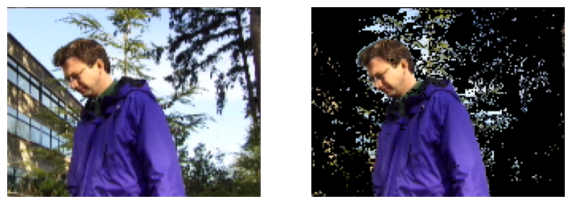

In [14]:
test_frame = cv2.imread(f"./DataSet/WavingTrees/b00255.bmp")
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 20))
ax[0].imshow(cv2.cvtColor(test_frame, cv2.COLOR_BGR2RGB))
ax[0].axis("off")
ax[1].imshow(render(mu, sigma, test_frame, True))
ax[1].axis("off")

### 生成视频

通过`matplotlib`中的`animation`模块生成视频并展示在此页面中。

In [15]:
def display_video(frames:list, framerate:int=30, dpi:int=70):
    '''
        在Jupyter Notebook页面中生成视频
    '''
    height, width, _ = frames[0].shape
    orig_backend = matplotlib.get_backend()
    matplotlib.use('Agg') 
    fig, ax = plt.subplots(1, 1, figsize=(width / dpi, height / dpi))
    matplotlib.use(orig_backend)
    ax.set_axis_off()
    ax.set_aspect('equal')
    ax.set_position([0, 0, 1, 1])
    im = ax.imshow(frames[0])
    def update(frame):
      im.set_data(frame)
      return [im]
    interval = 1000/framerate
    anim = animation.FuncAnimation(fig=fig, func=update, frames=frames,
                                   interval=interval, blit=True, repeat=False)
    return HTML(anim.to_html5_video())

def render_frames(mu, sigma, data_path="./DataSet/WavingTrees/", comparison=False):
    """
    将所有的测试图像渲染可视化。
    """
    file_names = os.listdir(data_path)
    file_names.sort()
    file_names = file_names[:-2]
    frames = []
    for file_name in tqdm(file_names):
        frame = cv2.imread(os.path.join(data_path, file_name))
        if not comparison:
            out_frame = render(mu, sigma, frame, True)
        else:
            out_frame = np.zeros((frame.shape[0], frame.shape[1]*2, frame.shape[2]), dtype=int)
            out_frame[:, :frame.shape[1], :] = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            out_frame[:, frame.shape[1]:, :] = render(mu, sigma, frame, True)
        frames.append(out_frame)
    return frames
    

In [16]:
frames = render_frames(mu, sigma)
display_video(frames, 8, 30)

  0%|          | 0/287 [00:00<?, ?it/s]

In [17]:
frames_compar = render_frames(mu, sigma, comparison=True)
display_video(frames_compar, 8, 40)

  0%|          | 0/287 [00:00<?, ?it/s]